In [1]:
import pandas as pd
import numpy as np
import requests
from datetime import datetime, timedelta
from dateutil.relativedelta import relativedelta
import matplotlib.pyplot as plt
import seaborn as sns
sns.set(style='darkgrid')
from sklearn.metrics import r2_score
from sklearn.cluster import KMeans
import statsmodels.api as sm
from colorama import Fore, Style
from scipy.optimize import fsolve, curve_fit
import yfinance as yf
import akshare as ak
import sys
sys.path.append('../src') 
from utils import plot_candlestick, get_optimum_clusters, exponential_func

from chinese_etf_strategy import etf_strategy, etf_regression
from chinese_commodity_strategy import commodity_strategy

## Some sample code that're working

In [2]:
# Tongxin ETF, changnei, history
etf_code = "sh515880"  # ETF代码
etf_hist = ak.fund_etf_hist_sina(symbol=etf_code)
etf_hist.tail()

,date,open,high,low,close,volume
1439,2025-08-15,1.914,1.962,1.914,1.949,343655950
1440,2025-08-18,1.952,2.062,1.936,2.032,372588743
1441,2025-08-19,2.029,2.117,2.024,2.114,450253026
1442,2025-08-20,2.070,2.121,2.021,2.120,601886195
1443,2025-08-21,2.129,2.150,2.066,2.098,505685078


In [3]:
# Tongxin ETF, changnei, realtime
df = ak.fund_etf_spot_ths()
df[df['基金代码']=='515880']

,序号,基金代码,基金名称,当前-单位净值,当前-累计净值,前一日-单位净值,前一日-累计净值,增长值,增长率,赎回状态,申购状态,最新-交易日,最新-单位净值,最新-累计净值,基金类型,查询日期
1132,1133,515880,国泰中证全指通信设备ETF,2.095,2.095,2.1168,2.1168,-0.0218,-1.03,开放,开放,2025-08-21,2.095,2.095,股票型,2025-08-21


In [4]:
# Tongxin ETF, changnei, lishi and shishi
etf_code = "515880"  # ETF代码
start_date = (datetime.today() - relativedelta(years=3)).strftime('%Y%m%d')   # 开始日期
end_date = datetime.today().strftime('%Y%m%d')  # 结束日期

etf_hist = ak.fund_etf_hist_em(symbol=etf_code, period="daily", start_date=start_date, end_date=end_date, adjust="")
etf_hist.rename(columns={"日期": 'date', "开盘": 'open', "收盘": 'close', "最高": 'high', "最低": 'low', "成交量": 'volume', "成交额": 'amount'}, inplace=True)
etf_hist.tail()

  0%|          | 0/12 [00:00<?, ?it/s]

,date,open,close,high,low,volume,amount,振幅,涨跌幅,涨跌额,换手率
723,2025-08-15,1.914,1.949,1.962,1.914,3436560,6.671674e+08,2.49,0.98,0.019,12.60
724,2025-08-18,1.952,2.032,2.062,1.936,3725887,7.487094e+08,6.46,4.26,0.083,13.67
725,2025-08-19,2.029,2.114,2.117,2.024,4502530,9.401766e+08,4.58,4.04,0.082,16.51
726,2025-08-20,2.070,2.120,2.121,2.021,6018862,1.249311e+09,4.73,0.28,0.006,22.08
727,2025-08-21,2.129,2.098,2.150,2.066,5056851,1.060647e+09,3.96,-1.04,-0.022,18.55


In [5]:
# Huangjin, history
spot_hist_sge_df = ak.spot_hist_sge(symbol='Au99.99')
spot_hist_sge_df['date']= pd.to_datetime(spot_hist_sge_df['date'])
spot_hist_sge_df.tail()

,date,open,close,low,high
2101,2025-08-15,775.0,773.55,770.2,775.00
2102,2025-08-18,769.0,774.46,769.0,781.00
2103,2025-08-19,774.0,773.05,771.2,774.50
2104,2025-08-20,772.0,770.24,767.6,774.49
2105,2025-08-21,773.0,772.00,771.2,775.00


In [6]:
last_49day_price = spot_hist_sge_df['close'][-50:-1]
p_ma = np.mean(last_49day_price)
print('50MA break point:', round(p_ma,2))

50MA break point: 774.57


In [7]:
# Huangjin, realtime
spot_quotations_sge_df = ak.spot_quotations_sge(symbol="Au99.99")
spot_quotations_sge_df[spot_quotations_sge_df['时间'] == spot_quotations_sge_df['时间'].max()]

,品种,时间,现价,更新时间
147,Au99.99,02:27:00,774.0,2025年08月22日 02:27:55


In [8]:
spot_quotations_sge_df[spot_quotations_sge_df['时间'] == spot_quotations_sge_df['时间'].max()]['现价']

147    774.0
Name: 现价, dtype: float64

## ALL ETFs

* Current etf price: 0.82
* Recent high: 0.9
* Current etf price is at 91.42% of recent high
Latest 20 Day MA: 0.79
Latest lower Bollinger Band, 20MA: 0.77
Latest higher Bollinger Band, 20MA: 0.81
Latest 50 Day MA: 0.76
Latest lower Bollinger Band, 50MA: 0.68
Latest higher Bollinger Band, 50MA: 0.83
Latest 50 Day EMA: 0.76
Latest 120 Day MA: 0.73
Latest 200 Day MA: 0.74
Latest 200 Day EMA: 0.74
Latest 10 Week MA: 0.76
Latest 20 Week MA: 0.74
Latest 30 Week MA: 0.74
Latest 40 Week MA: 0.74
Latest Lower Weekly Bollinger Band, 20MA: 0.66
Latest Higher Weekly Bollinger Band, 20MA: 0.81

Latest RSI: 65.85 
Latest MACD Divergence: 0.0 
20MA break point: 0.79
20MA lower Bollinger Band break point: 0.76
20MA Upper Bollinger Band break point: 0.81
50MA break point: 0.76
50MA lower Bollinger Band break point: 0.68
50MA Upper Bollinger Band break point: 0.83
120MA break point: 0.73
200MA break point: 0.74


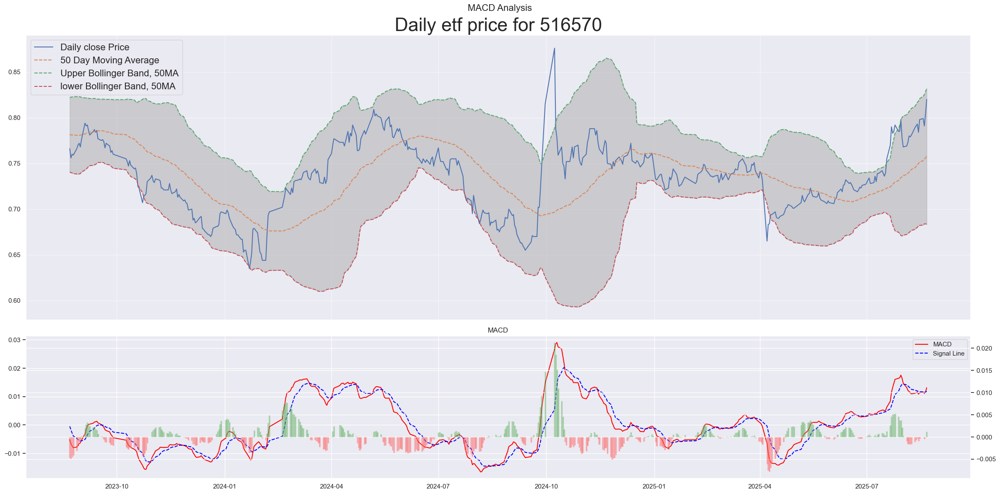

In [9]:
# 石油石化
etf_code = "516570"
etf_strategy(etf_code).output()

* Current etf price: 1.5
* Recent high: 1.6
* Current etf price is at 93.75% of recent high
Latest 20 Day MA: 1.51
Latest lower Bollinger Band, 20MA: 1.47
Latest higher Bollinger Band, 20MA: 1.54
Latest 50 Day MA: 1.52
Latest lower Bollinger Band, 50MA: 1.43
Latest higher Bollinger Band, 50MA: 1.6
Latest 50 Day EMA: 1.5
Latest 120 Day MA: 1.43
Latest 200 Day MA: 1.36
Latest 200 Day EMA: 1.37
Latest 10 Week MA: 1.52
Latest 20 Week MA: 1.45
Latest 30 Week MA: 1.41
Latest 40 Week MA: 1.37
Latest Lower Weekly Bollinger Band, 20MA: 1.3
Latest Higher Weekly Bollinger Band, 20MA: 1.61

Latest RSI: 50.85 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 1.95
20MA break point: 1.5
20MA lower Bollinger Band break point: 1.47
20MA Upper Bollinger Band break point: 1.54
50MA break point: 1.52
50MA lower Bollinger Band break point: 1.43
50MA Upper Bollinger Band break point: 1.61
120MA break point: 1.43
200MA break point: 1.36


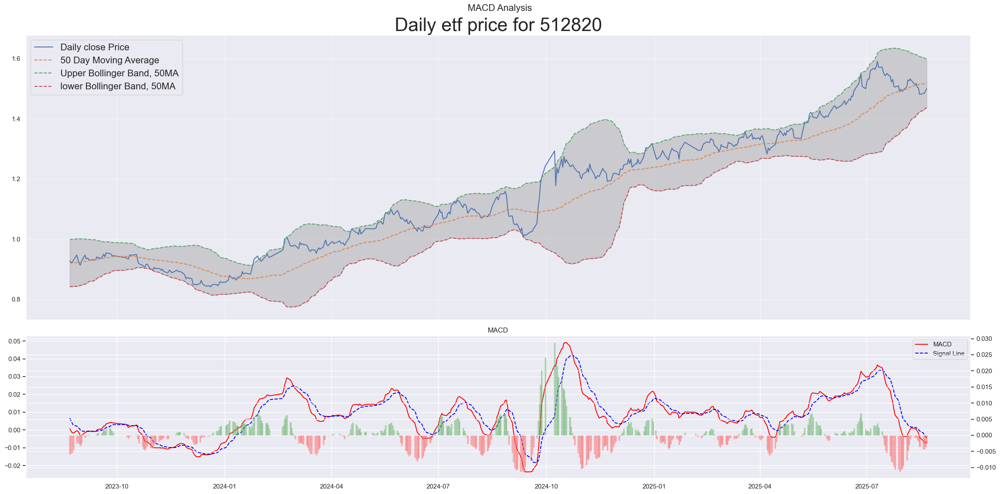

In [10]:
# 中证银行
etf_code = "512820"
etf_strategy(etf_code).output()

* Current etf price: 1.72
* Recent high: 1.76
* Current etf price is at 97.72% of recent high
Latest 20 Day MA: 1.67
Latest lower Bollinger Band, 20MA: 1.62
Latest higher Bollinger Band, 20MA: 1.71
Latest 50 Day MA: 1.61
Latest lower Bollinger Band, 50MA: 1.46
Latest higher Bollinger Band, 50MA: 1.75
Latest 50 Day EMA: 1.62
Latest 120 Day MA: 1.57
Latest 200 Day MA: 1.58
Latest 200 Day EMA: 1.56
Latest 10 Week MA: 1.62
Latest 20 Week MA: 1.57
Latest 30 Week MA: 1.58
Latest 40 Week MA: 1.57
Latest Lower Weekly Bollinger Band, 20MA: 1.43
Latest Higher Weekly Bollinger Band, 20MA: 1.71

Latest RSI: 80.79 
Latest MACD Divergence: 0.0 
20MA break point: 1.67
20MA lower Bollinger Band break point: 1.61
20MA Upper Bollinger Band break point: 1.72
50MA break point: 1.61
50MA lower Bollinger Band break point: 1.45
50MA Upper Bollinger Band break point: 1.77
120MA break point: 1.57
200MA break point: 1.58


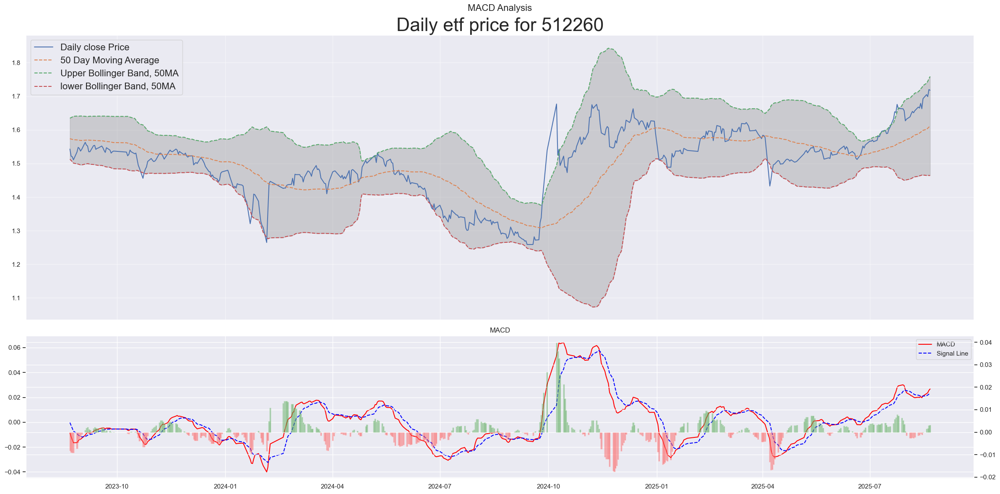

In [11]:
# 500低波
etf_code = "512260"
etf_strategy(etf_code).output()

* Current etf price: 1.2
* Recent high: 1.24
* Current etf price is at 97.17% of recent high
Latest 20 Day MA: 1.11
Latest lower Bollinger Band, 20MA: 1.02
Latest higher Bollinger Band, 20MA: 1.19
Latest 50 Day MA: 1.06
Latest lower Bollinger Band, 50MA: 0.93
Latest higher Bollinger Band, 50MA: 1.18
Latest 50 Day EMA: 1.08
Latest 120 Day MA: 1.05
Latest 200 Day MA: 1.04
Latest 200 Day EMA: 1.01
Latest 10 Week MA: 1.07
Latest 20 Week MA: 1.05
Latest 30 Week MA: 1.06
Latest 40 Week MA: 1.05
Latest Lower Weekly Bollinger Band, 20MA: 0.95
Latest Higher Weekly Bollinger Band, 20MA: 1.15

Latest RSI: 79.39 
Latest MACD Divergence: 0.01 
50MA crosses 200MA at 0.13
20MA break point: 1.11
20MA lower Bollinger Band break point: 1.01
20MA Upper Bollinger Band break point: 1.2
50MA break point: 1.06
50MA lower Bollinger Band break point: 0.92
50MA Upper Bollinger Band break point: 1.19
120MA break point: 1.05
200MA break point: 1.04


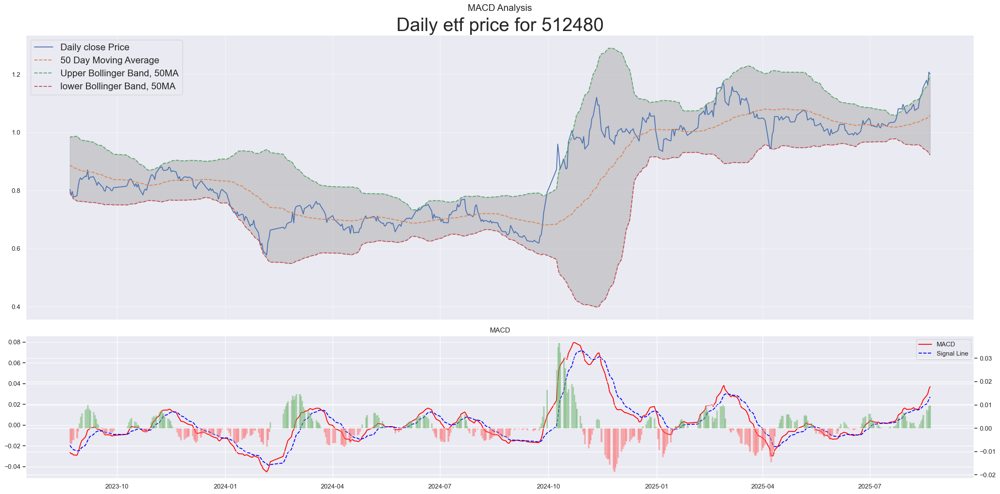

In [12]:
# 半导体
etf_code = "512480"
etf_strategy(etf_code).output()

* Current etf price: 1.03
* Recent high: 1.15
* Current etf price is at 89.24% of recent high
Latest 20 Day MA: 1.0
Latest lower Bollinger Band, 20MA: 0.96
Latest higher Bollinger Band, 20MA: 1.03
Latest 50 Day MA: 0.97
Latest lower Bollinger Band, 50MA: 0.88
Latest higher Bollinger Band, 50MA: 1.06
Latest 50 Day EMA: 0.97
Latest 120 Day MA: 0.94
Latest 200 Day MA: 0.97
Latest 200 Day EMA: 0.96
Latest 10 Week MA: 0.97
Latest 20 Week MA: 0.94
Latest 30 Week MA: 0.94
Latest 40 Week MA: 0.96
Latest Lower Weekly Bollinger Band, 20MA: 0.84
Latest Higher Weekly Bollinger Band, 20MA: 1.03

Latest RSI: 80.2 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.13
50MA crosses 200MA at 0.84
20MA break point: 0.99
20MA lower Bollinger Band break point: 0.95
20MA Upper Bollinger Band break point: 1.04
50MA break point: 0.97
50MA lower Bollinger Band break point: 0.87
50MA Upper Bollinger Band break point: 1.06
120MA break point: 0.94
200MA break point: 0.97


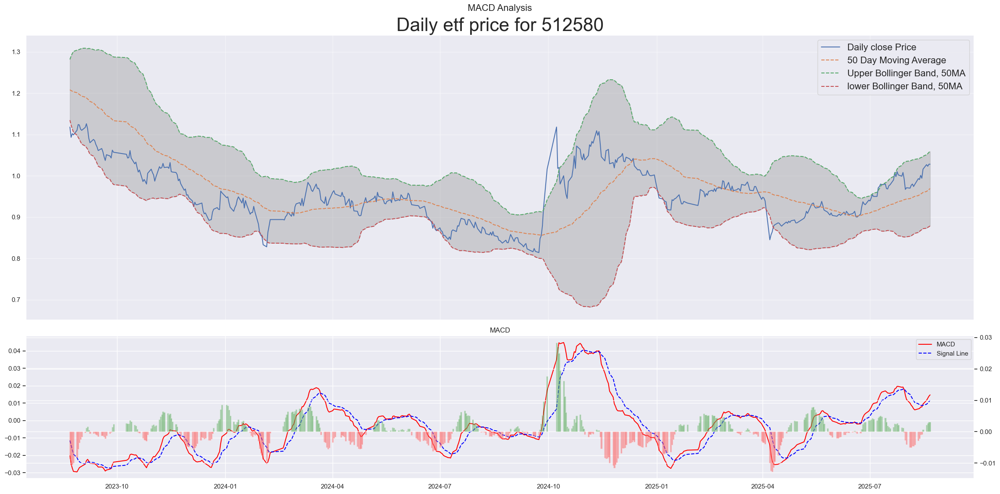

In [13]:
# 环保
etf_code = "512580"
etf_strategy(etf_code).output()

* Current etf price: 2.86
* Recent high: 3.02
* Current etf price is at 94.89% of recent high
Latest 20 Day MA: 2.66
Latest lower Bollinger Band, 20MA: 2.44
Latest higher Bollinger Band, 20MA: 2.88
Latest 50 Day MA: 2.48
Latest lower Bollinger Band, 50MA: 2.04
Latest higher Bollinger Band, 50MA: 2.93
Latest 50 Day EMA: 2.53
Latest 120 Day MA: 2.35
Latest 200 Day MA: 2.36
Latest 200 Day EMA: 2.33
Latest 10 Week MA: 2.52
Latest 20 Week MA: 2.35
Latest 30 Week MA: 2.36
Latest 40 Week MA: 2.35
Latest Lower Weekly Bollinger Band, 20MA: 1.9
Latest Higher Weekly Bollinger Band, 20MA: 2.8

Latest RSI: 84.63 
Latest MACD Divergence: 0.02 
20MA break point: 2.66
20MA lower Bollinger Band break point: 2.4
20MA Upper Bollinger Band break point: 2.93
50MA break point: 2.49
50MA lower Bollinger Band break point: 2.01
50MA Upper Bollinger Band break point: 2.97
120MA break point: 2.35
200MA break point: 2.36


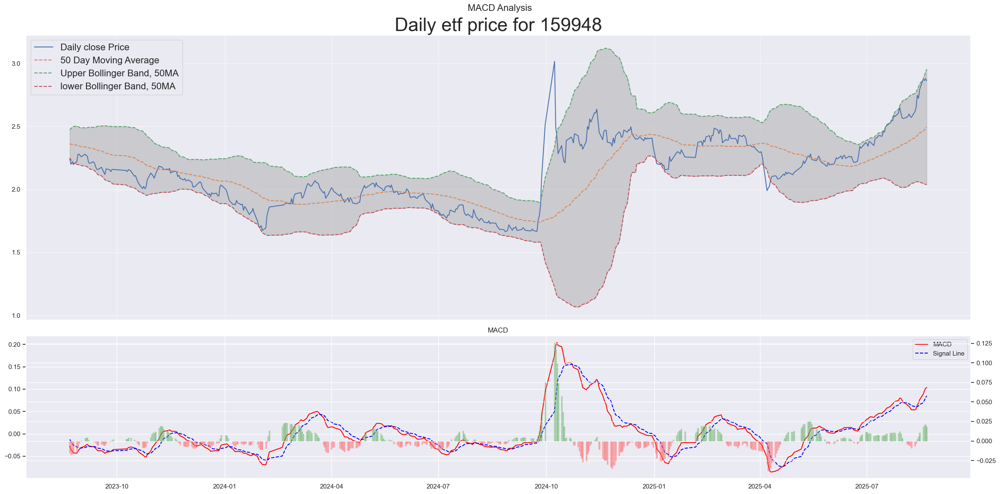

In [14]:
# 创业板
etf_code = "159948"
etf_strategy(etf_code).output()

* Current etf price: 0.98
* Recent high: 1.05
* Current etf price is at 93.35% of recent high
Latest 20 Day MA: 0.93
Latest lower Bollinger Band, 20MA: 0.86
Latest higher Bollinger Band, 20MA: 1.0
Latest 50 Day MA: 0.88
Latest lower Bollinger Band, 50MA: 0.75
Latest higher Bollinger Band, 50MA: 1.01
Latest 50 Day EMA: 0.9
Latest 120 Day MA: 0.88
Latest 200 Day MA: 0.86
Latest 200 Day EMA: 0.84
Latest 10 Week MA: 0.88
Latest 20 Week MA: 0.86
Latest 30 Week MA: 0.88
Latest 40 Week MA: 0.86
Latest Lower Weekly Bollinger Band, 20MA: 0.76
Latest Higher Weekly Bollinger Band, 20MA: 0.96

Latest RSI: 81.98 
Latest MACD Divergence: 0.01 
20MA break point: 0.93
20MA lower Bollinger Band break point: 0.85
20MA Upper Bollinger Band break point: 1.01
50MA break point: 0.88
50MA lower Bollinger Band break point: 0.74
50MA Upper Bollinger Band break point: 1.02
120MA break point: 0.88
200MA break point: 0.86


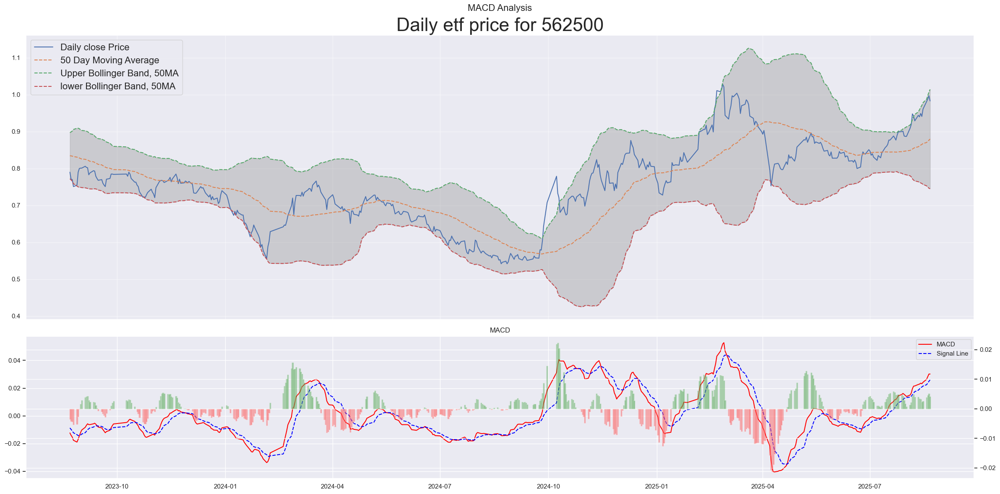

In [15]:
# 机器人
etf_code = "562500"
etf_strategy(etf_code).output()

* Current etf price: 1.23
* Recent high: 1.25
* Current etf price is at 97.92999999999999% of recent high
Latest 20 Day MA: 1.1
Latest lower Bollinger Band, 20MA: 0.98
Latest higher Bollinger Band, 20MA: 1.22
Latest 50 Day MA: 1.01
Latest lower Bollinger Band, 50MA: 0.8
Latest higher Bollinger Band, 50MA: 1.22
Latest 50 Day EMA: 1.04
Latest 120 Day MA: 0.97
Latest 200 Day MA: 0.95
Latest 200 Day EMA: 0.94
Latest 10 Week MA: 1.03
Latest 20 Week MA: 0.97
Latest 30 Week MA: 0.98
Latest 40 Week MA: 0.96
Latest Lower Weekly Bollinger Band, 20MA: 0.78
Latest Higher Weekly Bollinger Band, 20MA: 1.16

Latest RSI: 83.81 
Latest MACD Divergence: 0.01 
20MA break point: 1.1
20MA lower Bollinger Band break point: 0.97
20MA Upper Bollinger Band break point: 1.24
50MA break point: 1.01
50MA lower Bollinger Band break point: 0.79
50MA Upper Bollinger Band break point: 1.24
120MA break point: 0.97
200MA break point: 0.95


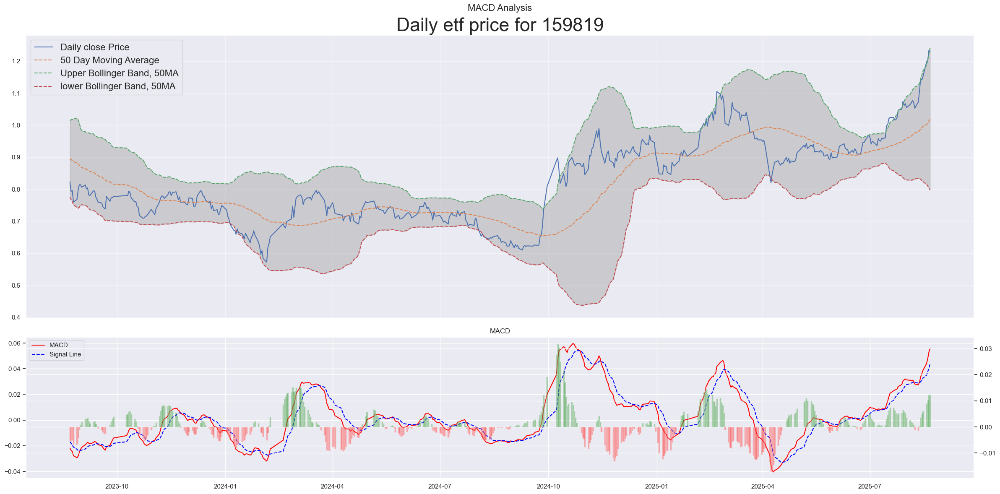

In [16]:
# 人工智能
etf_code = "159819"
etf_strategy(etf_code).output()

* Current etf price: 0.72
* Recent high: 1.01
* Current etf price is at 71.13000000000001% of recent high
Latest 20 Day MA: 0.7
Latest lower Bollinger Band, 20MA: 0.68
Latest higher Bollinger Band, 20MA: 0.71
Latest 50 Day MA: 0.69
Latest lower Bollinger Band, 50MA: 0.66
Latest higher Bollinger Band, 50MA: 0.72
Latest 50 Day EMA: 0.69
Latest 120 Day MA: 0.69
Latest 200 Day MA: 0.69
Latest 200 Day EMA: 0.69
Latest 10 Week MA: 0.69
Latest 20 Week MA: 0.69
Latest 30 Week MA: 0.69
Latest 40 Week MA: 0.69
Latest Lower Weekly Bollinger Band, 20MA: 0.67
Latest Higher Weekly Bollinger Band, 20MA: 0.72

Latest RSI: 91.67 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.38
50MA crosses 200MA at 0.96
20MA break point: 0.7
20MA lower Bollinger Band break point: 0.68
20MA Upper Bollinger Band break point: 0.71
50MA break point: 0.69
50MA lower Bollinger Band break point: 0.66
50MA Upper Bollinger Band break point: 0.72
120MA break point: 0.69
200MA break point: 0.69


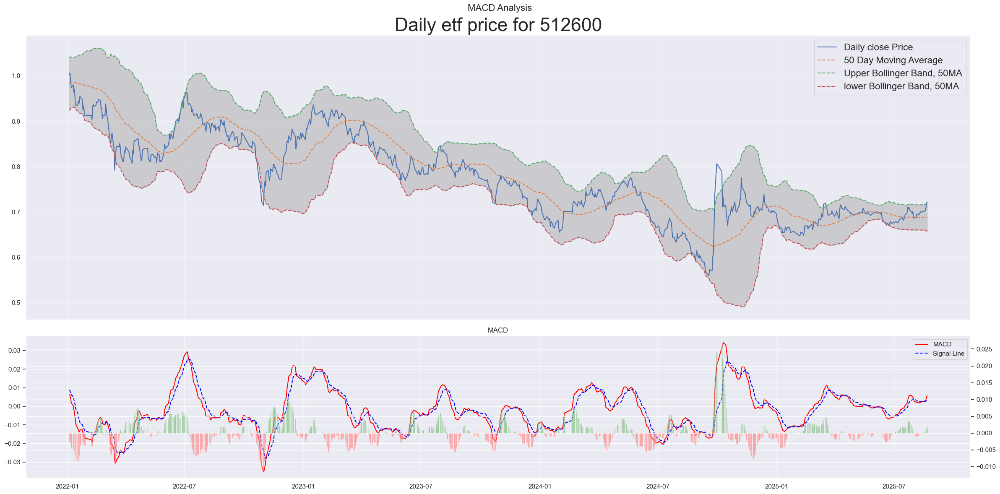

In [17]:
# 必选消费
etf_code = "512600"
etf_strategy(etf_code, start='20210101').output()

* Current etf price: 1.55
* Recent high: 1.56
* Current etf price is at 99.1% of recent high
Latest 20 Day MA: 1.48
Latest lower Bollinger Band, 20MA: 1.41
Latest higher Bollinger Band, 20MA: 1.56
Latest 50 Day MA: 1.43
Latest lower Bollinger Band, 50MA: 1.3
Latest higher Bollinger Band, 50MA: 1.57
Latest 50 Day EMA: 1.45
Latest 120 Day MA: 1.41
Latest 200 Day MA: 1.41
Latest 200 Day EMA: 1.38
Latest 10 Week MA: 1.44
Latest 20 Week MA: 1.41
Latest 30 Week MA: 1.42
Latest 40 Week MA: 1.41
Latest Lower Weekly Bollinger Band, 20MA: 1.29
Latest Higher Weekly Bollinger Band, 20MA: 1.52

Latest RSI: 89.03 
Latest MACD Divergence: 0.01 
20MA break point: 1.48
20MA lower Bollinger Band break point: 1.39
20MA Upper Bollinger Band break point: 1.57
50MA break point: 1.43
50MA lower Bollinger Band break point: 1.29
50MA Upper Bollinger Band break point: 1.58
120MA break point: 1.41
200MA break point: 1.41


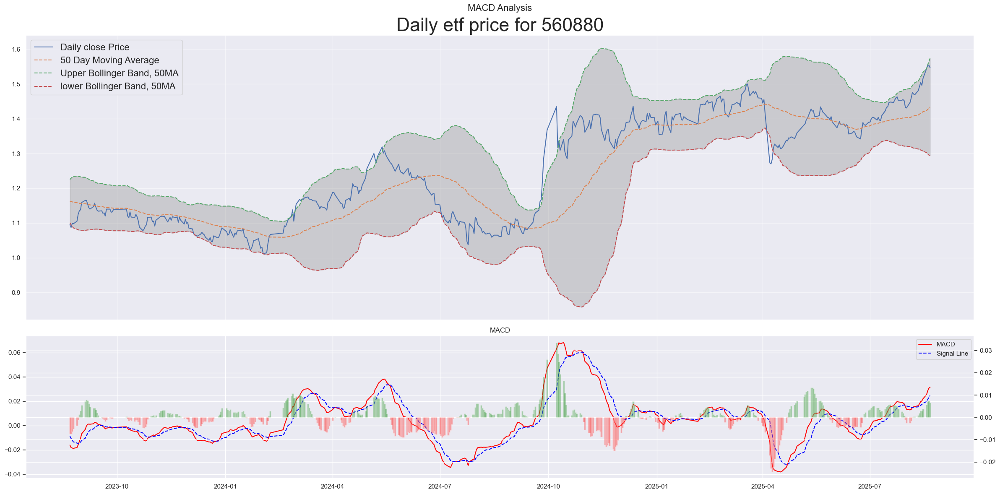

In [18]:
# 家电
etf_code = "560880"
etf_strategy(etf_code).output()

* Current etf price: 1.35
* Recent high: 1.38
* Current etf price is at 98.11% of recent high
Latest 20 Day MA: 1.29
Latest lower Bollinger Band, 20MA: 1.21
Latest higher Bollinger Band, 20MA: 1.37
Latest 50 Day MA: 1.2
Latest lower Bollinger Band, 50MA: 1.0
Latest higher Bollinger Band, 50MA: 1.41
Latest 50 Day EMA: 1.22
Latest 120 Day MA: 1.12
Latest 200 Day MA: 1.09
Latest 200 Day EMA: 1.11
Latest 10 Week MA: 1.22
Latest 20 Week MA: 1.14
Latest 30 Week MA: 1.11
Latest 40 Week MA: 1.09
Latest Lower Weekly Bollinger Band, 20MA: 0.92
Latest Higher Weekly Bollinger Band, 20MA: 1.36

Latest RSI: 85.47 
Latest MACD Divergence: 0.0 
20MA break point: 1.29
20MA lower Bollinger Band break point: 1.2
20MA Upper Bollinger Band break point: 1.39
50MA break point: 1.21
50MA lower Bollinger Band break point: 0.98
50MA Upper Bollinger Band break point: 1.43
120MA break point: 1.12
200MA break point: 1.09


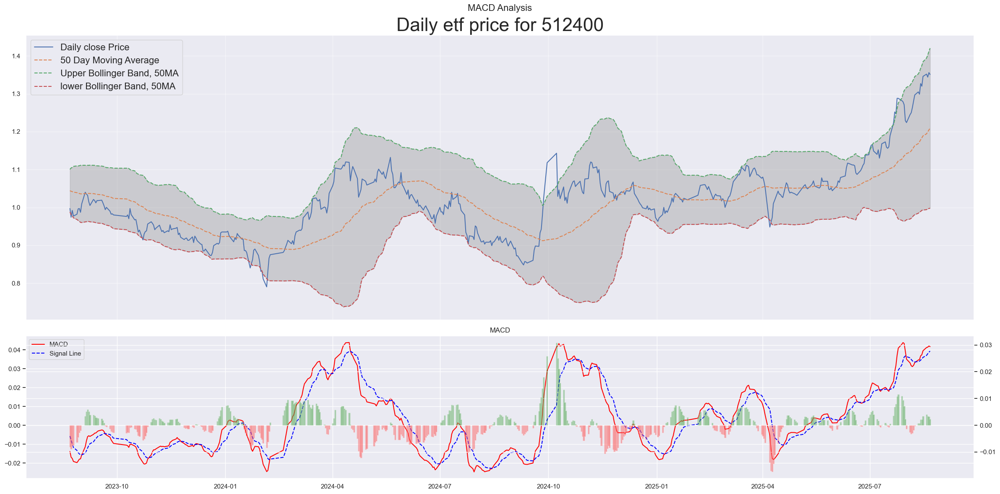

In [19]:
# 有色金属
etf_code = "512400"
etf_strategy(etf_code).output()

* Current etf price: 1.05
* Recent high: 1.2
* Current etf price is at 87.64% of recent high
Latest 20 Day MA: 1.03
Latest lower Bollinger Band, 20MA: 1.01
Latest higher Bollinger Band, 20MA: 1.05
Latest 50 Day MA: 1.02
Latest lower Bollinger Band, 50MA: 0.99
Latest higher Bollinger Band, 50MA: 1.06
Latest 50 Day EMA: 1.02
Latest 120 Day MA: 0.99
Latest 200 Day MA: 1.01
Latest 200 Day EMA: 1.0
Latest 10 Week MA: 1.02
Latest 20 Week MA: 0.99
Latest 30 Week MA: 0.99
Latest 40 Week MA: 1.0
Latest Lower Weekly Bollinger Band, 20MA: 0.92
Latest Higher Weekly Bollinger Band, 20MA: 1.07

Latest RSI: 58.02 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.74
20MA break point: 1.03
20MA lower Bollinger Band break point: 1.01
20MA Upper Bollinger Band break point: 1.05
50MA break point: 1.02
50MA lower Bollinger Band break point: 0.98
50MA Upper Bollinger Band break point: 1.06
120MA break point: 0.99
200MA break point: 1.01


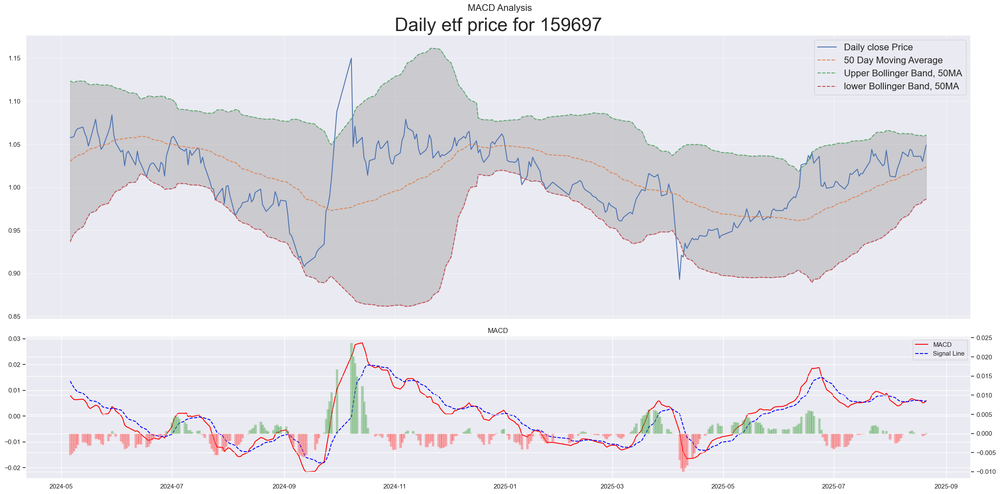

In [20]:
# 油气
etf_code = "159697"
etf_strategy(etf_code).output()

* Current etf price: 2.1
* Recent high: 2.15
* Current etf price is at 97.58% of recent high
Latest 20 Day MA: 1.82
Latest lower Bollinger Band, 20MA: 1.52
Latest higher Bollinger Band, 20MA: 2.12
Latest 50 Day MA: 1.6
Latest lower Bollinger Band, 50MA: 1.05
Latest higher Bollinger Band, 50MA: 2.15
Latest 50 Day EMA: 1.66
Latest 120 Day MA: 1.39
Latest 200 Day MA: 1.39
Latest 200 Day EMA: 1.4
Latest 10 Week MA: 1.65
Latest 20 Week MA: 1.43
Latest 30 Week MA: 1.4
Latest 40 Week MA: 1.39
Latest Lower Weekly Bollinger Band, 20MA: 0.87
Latest Higher Weekly Bollinger Band, 20MA: 1.99

Latest RSI: 84.39 
Latest MACD Divergence: 0.03 
20MA break point: 1.83
20MA lower Bollinger Band break point: 1.49
20MA Upper Bollinger Band break point: 2.17
50MA break point: 1.61
50MA lower Bollinger Band break point: 1.02
50MA Upper Bollinger Band break point: 2.2
120MA break point: 1.39
200MA break point: 1.39


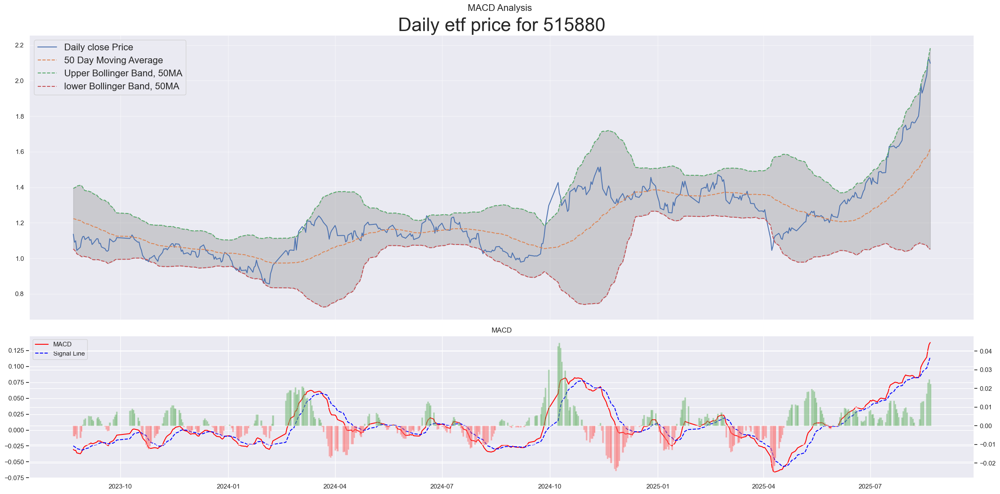

In [21]:
# 通信
etf_code = "515880"
etf_strategy(etf_code).output()

* Current etf price: 0.73
* Recent high: 0.75
* Current etf price is at 96.81% of recent high
Latest 20 Day MA: 0.72
Latest lower Bollinger Band, 20MA: 0.69
Latest higher Bollinger Band, 20MA: 0.74
Latest 50 Day MA: 0.67
Latest lower Bollinger Band, 50MA: 0.56
Latest higher Bollinger Band, 50MA: 0.78
Latest 50 Day EMA: 0.68
Latest 120 Day MA: 0.61
Latest 200 Day MA: 0.59
Latest 200 Day EMA: 0.6
Latest 10 Week MA: 0.68
Latest 20 Week MA: 0.63
Latest 30 Week MA: 0.61
Latest 40 Week MA: 0.59
Latest Lower Weekly Bollinger Band, 20MA: 0.51
Latest Higher Weekly Bollinger Band, 20MA: 0.75

Latest RSI: 53.41 
Latest MACD Divergence: -0.0 
20MA break point: 0.72
20MA lower Bollinger Band break point: 0.69
20MA Upper Bollinger Band break point: 0.75
50MA break point: 0.67
50MA lower Bollinger Band break point: 0.55
50MA Upper Bollinger Band break point: 0.79
120MA break point: 0.61
200MA break point: 0.59


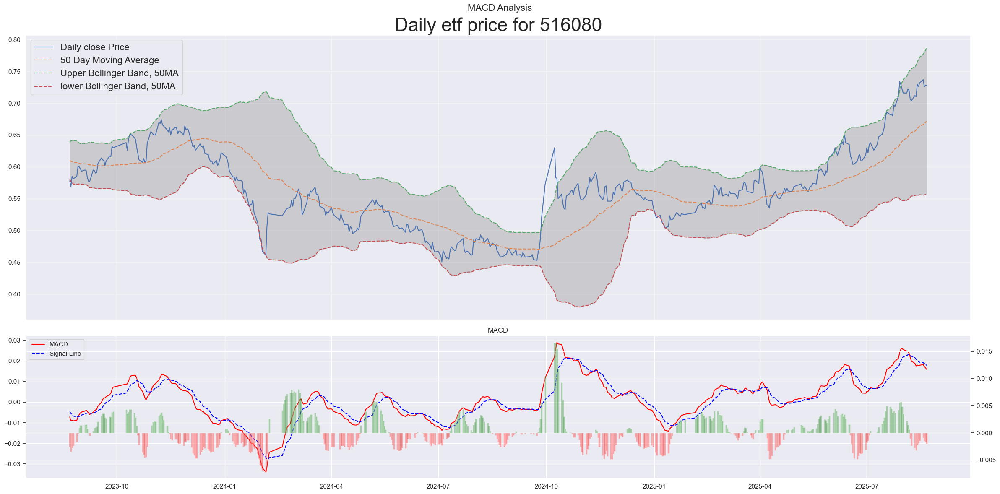

In [22]:
# 创新药
etf_code = "516080"
etf_strategy(etf_code).output()

* Current etf price: 1.07
* Recent high: 1.21
* Current etf price is at 88.71% of recent high
Latest 20 Day MA: 1.04
Latest lower Bollinger Band, 20MA: 1.02
Latest higher Bollinger Band, 20MA: 1.07
Latest 50 Day MA: 1.01
Latest lower Bollinger Band, 50MA: 0.93
Latest higher Bollinger Band, 50MA: 1.09
Latest 50 Day EMA: 1.02
Latest 120 Day MA: 0.98
Latest 200 Day MA: 0.99
Latest 200 Day EMA: 0.99
Latest 10 Week MA: 1.01
Latest 20 Week MA: 0.99
Latest 30 Week MA: 0.98
Latest 40 Week MA: 0.99
Latest Lower Weekly Bollinger Band, 20MA: 0.92
Latest Higher Weekly Bollinger Band, 20MA: 1.06

Latest RSI: 68.27 
Latest MACD Divergence: 0.0 
50MA crosses 200MA at 0.11
20MA break point: 1.04
20MA lower Bollinger Band break point: 1.01
20MA Upper Bollinger Band break point: 1.07
50MA break point: 1.01
50MA lower Bollinger Band break point: 0.92
50MA Upper Bollinger Band break point: 1.09
120MA break point: 0.98
200MA break point: 0.99


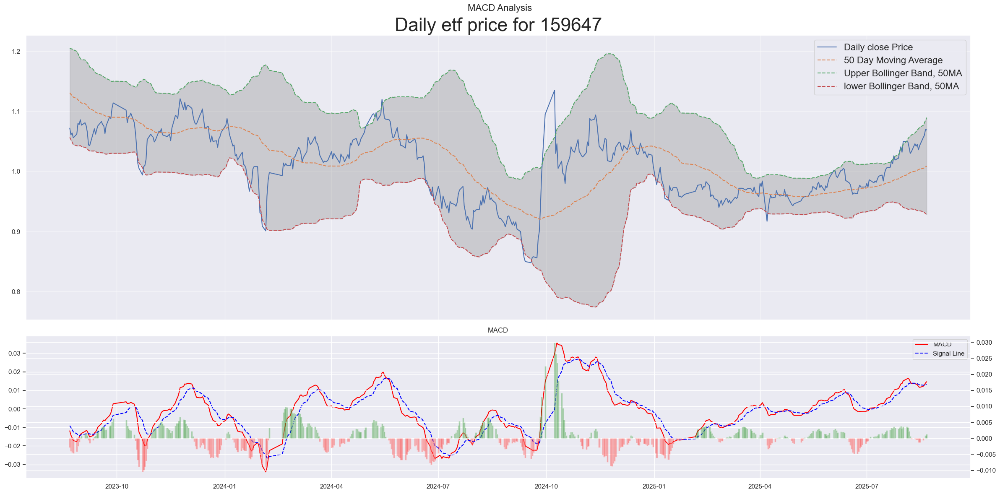

In [23]:
# 中药
etf_code = "159647"
etf_strategy(etf_code).output()

* Current etf price: 1.1
* Recent high: 1.4
* Current etf price is at 78.49000000000001% of recent high
Latest 20 Day MA: 1.09
Latest lower Bollinger Band, 20MA: 1.05
Latest higher Bollinger Band, 20MA: 1.13
Latest 50 Day MA: 1.04
Latest lower Bollinger Band, 50MA: 0.92
Latest higher Bollinger Band, 50MA: 1.17
Latest 50 Day EMA: 1.05
Latest 120 Day MA: 1.01
Latest 200 Day MA: 1.05
Latest 200 Day EMA: 1.05
Latest 10 Week MA: 1.05
Latest 20 Week MA: 1.01
Latest 30 Week MA: 1.02
Latest 40 Week MA: 1.04
Latest Lower Weekly Bollinger Band, 20MA: 0.91
Latest Higher Weekly Bollinger Band, 20MA: 1.11

Latest RSI: 62.39 
Latest MACD Divergence: -0.0 
50MA crosses 200MA at 1.79
20MA break point: 1.09
20MA lower Bollinger Band break point: 1.05
20MA Upper Bollinger Band break point: 1.13
50MA break point: 1.04
50MA lower Bollinger Band break point: 0.91
50MA Upper Bollinger Band break point: 1.18
120MA break point: 1.01
200MA break point: 1.05


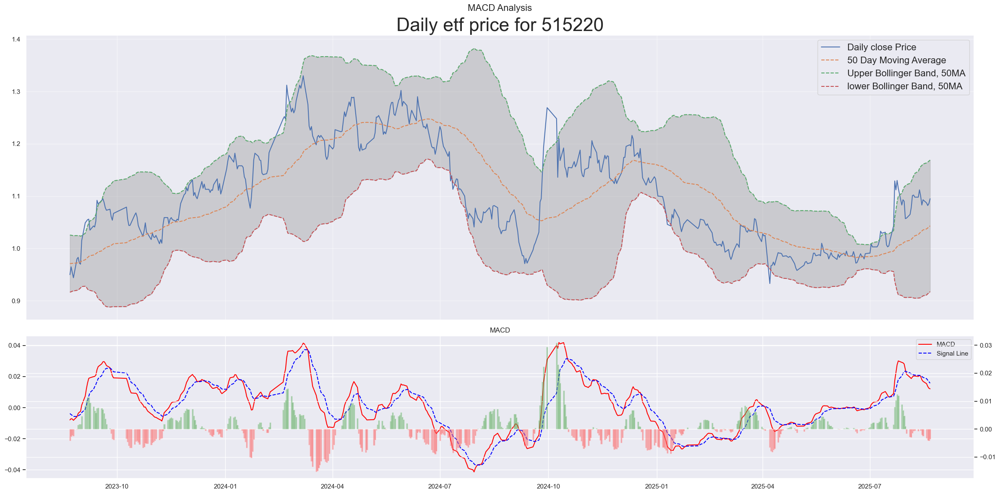

In [24]:
# 煤炭
etf_code = "515220"
etf_strategy(etf_code).output()

* Current etf price: 1.21
* Recent high: 1.24
* Current etf price is at 97.89999999999999% of recent high
Latest 20 Day MA: 1.2
Latest lower Bollinger Band, 20MA: 1.18
Latest higher Bollinger Band, 20MA: 1.21
Latest 50 Day MA: 1.2
Latest lower Bollinger Band, 50MA: 1.16
Latest higher Bollinger Band, 50MA: 1.24
Latest 50 Day EMA: 1.19
Latest 120 Day MA: 1.15
Latest 200 Day MA: 1.13
Latest 200 Day EMA: 1.13
Latest 10 Week MA: 1.2
Latest 20 Week MA: 1.17
Latest 30 Week MA: 1.14
Latest 40 Week MA: 1.13
Latest Lower Weekly Bollinger Band, 20MA: 1.09
Latest Higher Weekly Bollinger Band, 20MA: 1.25

Latest RSI: 72.88 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 1.3
20MA break point: 1.2
20MA lower Bollinger Band break point: 1.18
20MA Upper Bollinger Band break point: 1.21
50MA break point: 1.2
50MA lower Bollinger Band break point: 1.16
50MA Upper Bollinger Band break point: 1.24
120MA break point: 1.15
200MA break point: 1.13


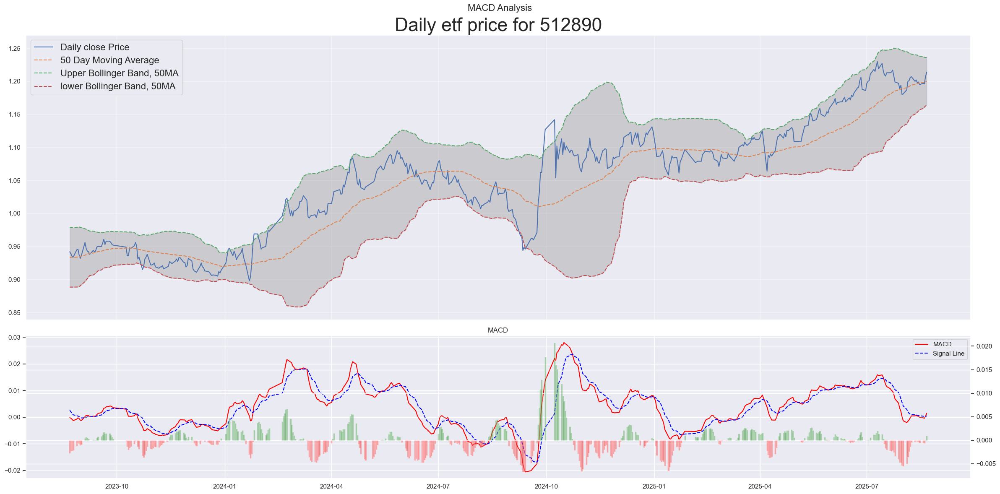

Regression price since launch: 1.19


In [25]:
# 红利低波
etf_code = "512890"
etf_strategy(etf_code).output()
print(f'Regression price since launch: {etf_regression(etf_code)}')

* Current etf price: 1.44
* Recent high: 1.56
* Current etf price is at 92.74% of recent high
Latest 20 Day MA: 1.43
Latest lower Bollinger Band, 20MA: 1.41
Latest higher Bollinger Band, 20MA: 1.46
Latest 50 Day MA: 1.41
Latest lower Bollinger Band, 50MA: 1.34
Latest higher Bollinger Band, 50MA: 1.48
Latest 50 Day EMA: 1.41
Latest 120 Day MA: 1.37
Latest 200 Day MA: 1.36
Latest 200 Day EMA: 1.36
Latest 10 Week MA: 1.42
Latest 20 Week MA: 1.38
Latest 30 Week MA: 1.37
Latest 40 Week MA: 1.36
Latest Lower Weekly Bollinger Band, 20MA: 1.3
Latest Higher Weekly Bollinger Band, 20MA: 1.47

Latest RSI: 62.5 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.75
20MA break point: 1.43
20MA lower Bollinger Band break point: 1.41
20MA Upper Bollinger Band break point: 1.46
50MA break point: 1.41
50MA lower Bollinger Band break point: 1.33
50MA Upper Bollinger Band break point: 1.49
120MA break point: 1.37
200MA break point: 1.36


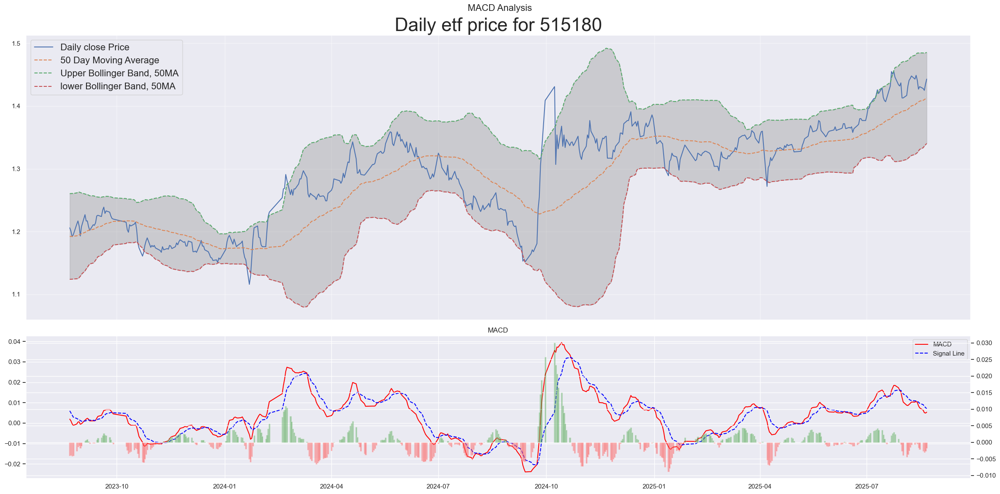

Regression price since launch: 1.44


In [26]:
# 红利
etf_code = "515180"
etf_strategy(etf_code).output()
print(f'Regression price since launch: {etf_regression(etf_code)}')

* Current commodity price: 147    774.0
Name: 现价, dtype: float64
* Recent high: 834.6
* Current commodity price is at 147    92.74
Name: 现价, dtype: float64% of recent high
Latest 20 Day MA: 774.2
Latest lower Bollinger Band, 20MA: 765.16
Latest higher Bollinger Band, 20MA: 783.23
Latest 50 Day MA: 774.69
Latest lower Bollinger Band, 50MA: 759.26
Latest higher Bollinger Band, 50MA: 790.11
Latest 50 Day EMA: 772.13
Latest 120 Day MA: 756.79
Latest 200 Day MA: 707.27
Latest 200 Day EMA: 713.89

Latest RSI: 54.08 
Latest MACD Divergence: -0.63 
20MA crosses 50MA at 788.2
20MA break point: 774.14
20MA lower Bollinger Band break point: 763.38
20MA Upper Bollinger Band break point: 784.9
50MA break point: 774.57
50MA lower Bollinger Band break point: 757.85
50MA Upper Bollinger Band break point: 791.29
120MA break point: 757.46
200MA break point: 707.66


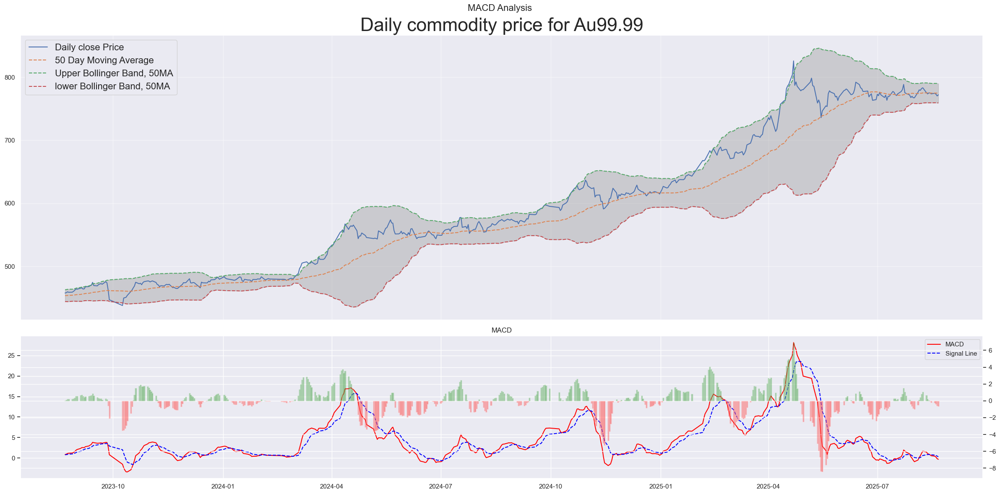

In [27]:
# 黄金
commodity_code = 'Au99.99'
commodity_strategy(commodity_code).output()

* Current etf price: 0.95
* Recent high: 0.96
* Current etf price is at 99.27% of recent high
Latest 20 Day MA: 0.9
Latest lower Bollinger Band, 20MA: 0.86
Latest higher Bollinger Band, 20MA: 0.95
Latest 50 Day MA: 0.87
Latest lower Bollinger Band, 50MA: 0.79
Latest higher Bollinger Band, 50MA: 0.95
Latest 50 Day EMA: 0.88
Latest 120 Day MA: 0.84
Latest 200 Day MA: 0.83
Latest 200 Day EMA: 0.82
Latest 10 Week MA: 0.88
Latest 20 Week MA: 0.84
Latest 30 Week MA: 0.84
Latest 40 Week MA: 0.83
Latest Lower Weekly Bollinger Band, 20MA: 0.73
Latest Higher Weekly Bollinger Band, 20MA: 0.94

Latest RSI: 83.64 
Latest MACD Divergence: 0.0 
20MA break point: 0.9
20MA lower Bollinger Band break point: 0.85
20MA Upper Bollinger Band break point: 0.95
50MA break point: 0.87
50MA lower Bollinger Band break point: 0.78
50MA Upper Bollinger Band break point: 0.96
120MA break point: 0.84
200MA break point: 0.83


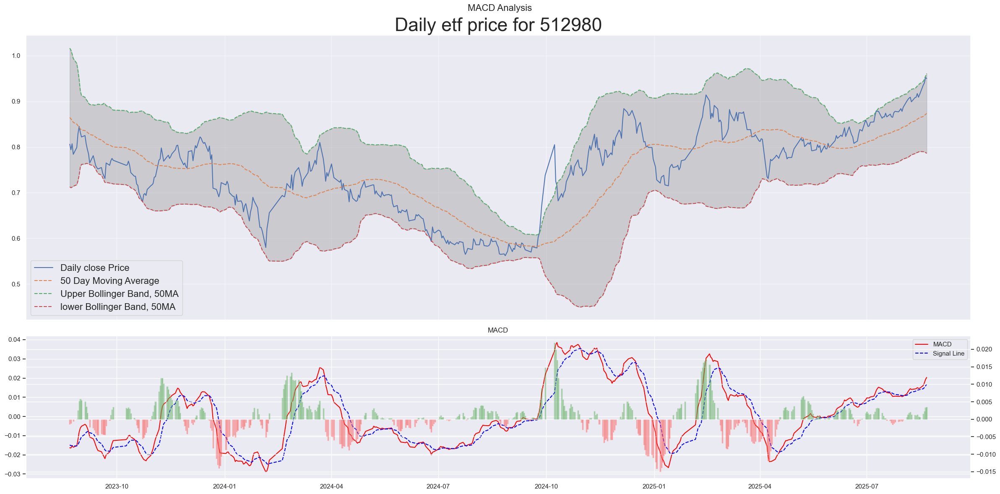

In [28]:
# 传媒
etf_code = "512980"
etf_strategy(etf_code).output()

* Current etf price: 1.32
* Recent high: 1.35
* Current etf price is at 97.92999999999999% of recent high
Latest 20 Day MA: 1.3
Latest lower Bollinger Band, 20MA: 1.27
Latest higher Bollinger Band, 20MA: 1.32
Latest 50 Day MA: 1.27
Latest lower Bollinger Band, 50MA: 1.19
Latest higher Bollinger Band, 50MA: 1.36
Latest 50 Day EMA: 1.27
Latest 120 Day MA: 1.2
Latest 200 Day MA: 1.18
Latest 200 Day EMA: 1.18
Latest 10 Week MA: 1.28
Latest 20 Week MA: 1.22
Latest 30 Week MA: 1.2
Latest 40 Week MA: 1.18
Latest Lower Weekly Bollinger Band, 20MA: 1.07
Latest Higher Weekly Bollinger Band, 20MA: 1.36

Latest RSI: 76.19 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.57
20MA break point: 1.3
20MA lower Bollinger Band break point: 1.27
20MA Upper Bollinger Band break point: 1.33
50MA break point: 1.28
50MA lower Bollinger Band break point: 1.19
50MA Upper Bollinger Band break point: 1.37
120MA break point: 1.2
200MA break point: 1.18


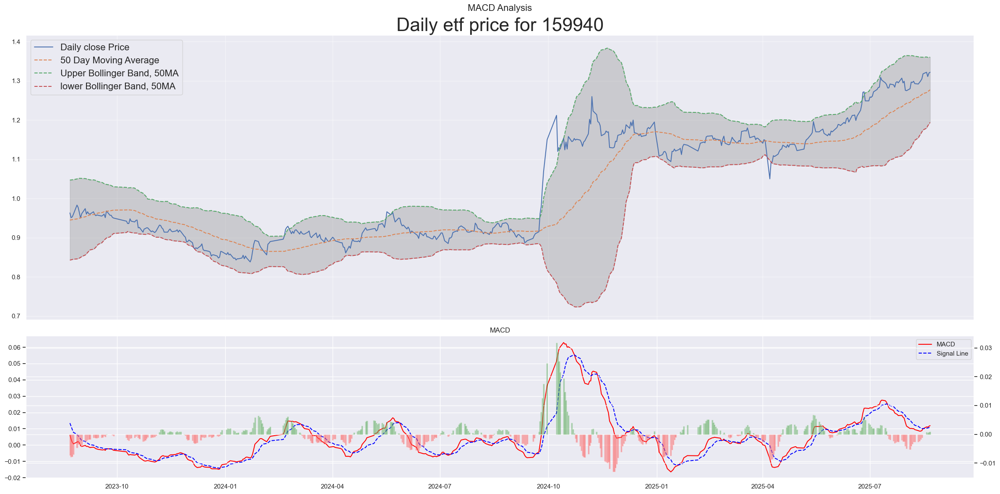

In [29]:
# 地产
etf_code = "159940"
etf_strategy(etf_code).output()

* Current etf price: 1.39
* Recent high: 1.42
* Current etf price is at 97.82% of recent high
Latest 20 Day MA: 1.31
Latest lower Bollinger Band, 20MA: 1.26
Latest higher Bollinger Band, 20MA: 1.37
Latest 50 Day MA: 1.3
Latest lower Bollinger Band, 50MA: 1.24
Latest higher Bollinger Band, 50MA: 1.36
Latest 50 Day EMA: 1.31
Latest 120 Day MA: 1.29
Latest 200 Day MA: 1.29
Latest 200 Day EMA: 1.26
Latest 10 Week MA: 1.3
Latest 20 Week MA: 1.29
Latest 30 Week MA: 1.3
Latest 40 Week MA: 1.29
Latest Lower Weekly Bollinger Band, 20MA: 1.22
Latest Higher Weekly Bollinger Band, 20MA: 1.37

Latest RSI: 84.88 
Latest MACD Divergence: 0.01 
20MA crosses 50MA at 0.82
50MA crosses 200MA at 0.61
20MA break point: 1.31
20MA lower Bollinger Band break point: 1.25
20MA Upper Bollinger Band break point: 1.38
50MA break point: 1.3
50MA lower Bollinger Band break point: 1.23
50MA Upper Bollinger Band break point: 1.36
120MA break point: 1.29
200MA break point: 1.29


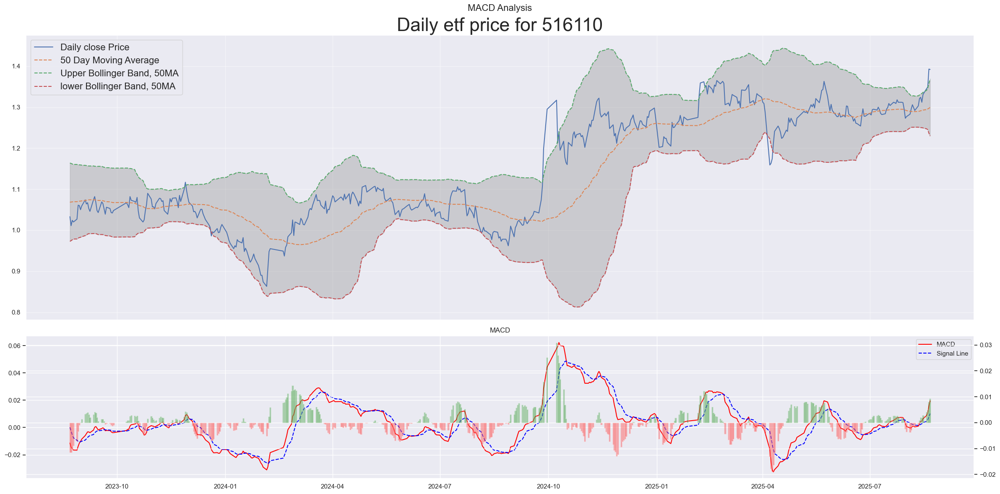

In [30]:
# 汽车
etf_code = "516110"
etf_strategy(etf_code).output()

* Current etf price: 1.42
* Recent high: 1.63
* Current etf price is at 87.46000000000001% of recent high
Latest 20 Day MA: 1.43
Latest lower Bollinger Band, 20MA: 1.39
Latest higher Bollinger Band, 20MA: 1.47
Latest 50 Day MA: 1.4
Latest lower Bollinger Band, 50MA: 1.29
Latest higher Bollinger Band, 50MA: 1.5
Latest 50 Day EMA: 1.41
Latest 120 Day MA: 1.4
Latest 200 Day MA: 1.33
Latest 200 Day EMA: 1.31
Latest 10 Week MA: 1.39
Latest 20 Week MA: 1.36
Latest 30 Week MA: 1.39
Latest 40 Week MA: 1.33
Latest Lower Weekly Bollinger Band, 20MA: 1.27
Latest Higher Weekly Bollinger Band, 20MA: 1.46

Latest RSI: 60.45 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.32
20MA break point: 1.43
20MA lower Bollinger Band break point: 1.39
20MA Upper Bollinger Band break point: 1.47
50MA break point: 1.4
50MA lower Bollinger Band break point: 1.28
50MA Upper Bollinger Band break point: 1.51
120MA break point: 1.39
200MA break point: 1.33


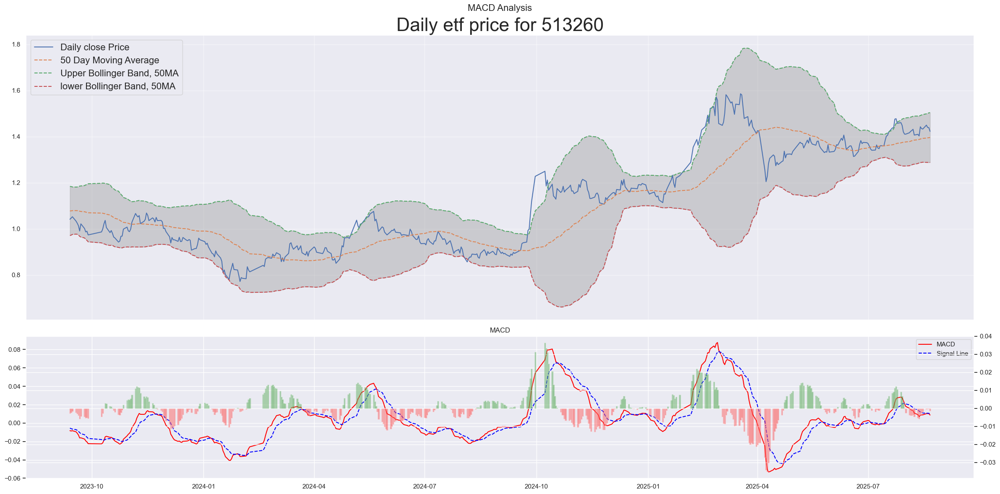

In [31]:
# 恒生科技
etf_code = "513260"
etf_strategy(etf_code).output()

* Current etf price: 0.72
* Recent high: 0.74
* Current etf price is at 96.63000000000001% of recent high
Latest 20 Day MA: 0.69
Latest lower Bollinger Band, 20MA: 0.65
Latest higher Bollinger Band, 20MA: 0.73
Latest 50 Day MA: 0.63
Latest lower Bollinger Band, 50MA: 0.48
Latest higher Bollinger Band, 50MA: 0.77
Latest 50 Day EMA: 0.63
Latest 120 Day MA: 0.54
Latest 200 Day MA: 0.48
Latest 200 Day EMA: 0.52
Latest 10 Week MA: 0.63
Latest 20 Week MA: 0.57
Latest 30 Week MA: 0.53
Latest 40 Week MA: 0.49
Latest Lower Weekly Bollinger Band, 20MA: 0.39
Latest Higher Weekly Bollinger Band, 20MA: 0.74

Latest RSI: 58.11 
Latest MACD Divergence: -0.0 
20MA break point: 0.69
20MA lower Bollinger Band break point: 0.64
20MA Upper Bollinger Band break point: 0.74
50MA break point: 0.63
50MA lower Bollinger Band break point: 0.47
50MA Upper Bollinger Band break point: 0.79
120MA break point: 0.54
200MA break point: 0.48


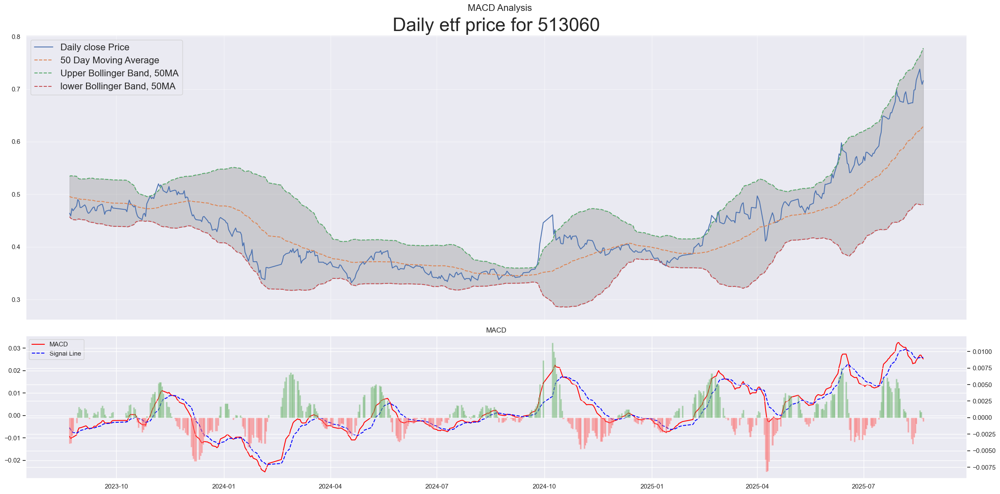

In [32]:
# 恒生医疗
etf_code = "513060"
etf_strategy(etf_code).output()

* Current etf price: 3.12
* Recent high: 3.19
* Current etf price is at 97.89999999999999% of recent high
Latest 20 Day MA: 3.11
Latest lower Bollinger Band, 20MA: 3.03
Latest higher Bollinger Band, 20MA: 3.19
Latest 50 Day MA: 3.03
Latest lower Bollinger Band, 50MA: 2.82
Latest higher Bollinger Band, 50MA: 3.24
Latest 50 Day EMA: 3.04
Latest 120 Day MA: 2.92
Latest 200 Day MA: 2.75
Latest 200 Day EMA: 2.77
Latest 10 Week MA: 3.03
Latest 20 Week MA: 2.92
Latest 30 Week MA: 2.89
Latest 40 Week MA: 2.77
Latest Lower Weekly Bollinger Band, 20MA: 2.63
Latest Higher Weekly Bollinger Band, 20MA: 3.22

Latest RSI: 63.86 
Latest MACD Divergence: -0.0 
20MA crosses 50MA at 0.54
20MA break point: 3.11
20MA lower Bollinger Band break point: 3.02
20MA Upper Bollinger Band break point: 3.2
50MA break point: 3.03
50MA lower Bollinger Band break point: 2.8
50MA Upper Bollinger Band break point: 3.26
120MA break point: 2.92
200MA break point: 2.75


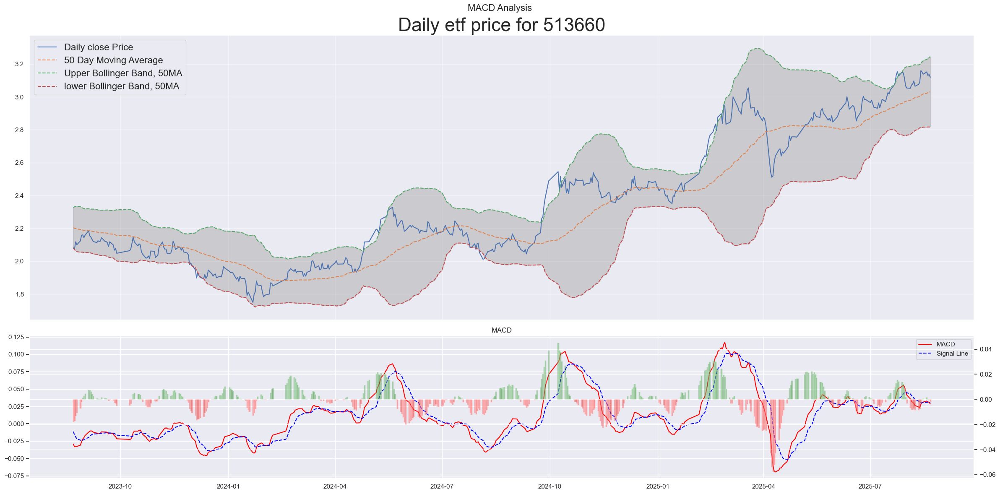

In [33]:
# 恒生
etf_code = "513660"
etf_strategy(etf_code).output()

* Current etf price: 1.44
* Recent high: 1.48
* Current etf price is at 97.57000000000001% of recent high
Latest 20 Day MA: 1.45
Latest lower Bollinger Band, 20MA: 1.43
Latest higher Bollinger Band, 20MA: 1.48
Latest 50 Day MA: 1.41
Latest lower Bollinger Band, 50MA: 1.31
Latest higher Bollinger Band, 50MA: 1.52
Latest 50 Day EMA: 1.41
Latest 120 Day MA: 1.31
Latest 200 Day MA: 1.25
Latest 200 Day EMA: 1.26
Latest 10 Week MA: 1.42
Latest 20 Week MA: 1.33
Latest 30 Week MA: 1.29
Latest 40 Week MA: 1.26
Latest Lower Weekly Bollinger Band, 20MA: 1.14
Latest Higher Weekly Bollinger Band, 20MA: 1.53

Latest RSI: 53.61 
Latest MACD Divergence: -0.01 
20MA crosses 50MA at 0.2
20MA break point: 1.45
20MA lower Bollinger Band break point: 1.42
20MA Upper Bollinger Band break point: 1.48
50MA break point: 1.41
50MA lower Bollinger Band break point: 1.3
50MA Upper Bollinger Band break point: 1.52
120MA break point: 1.31
200MA break point: 1.25


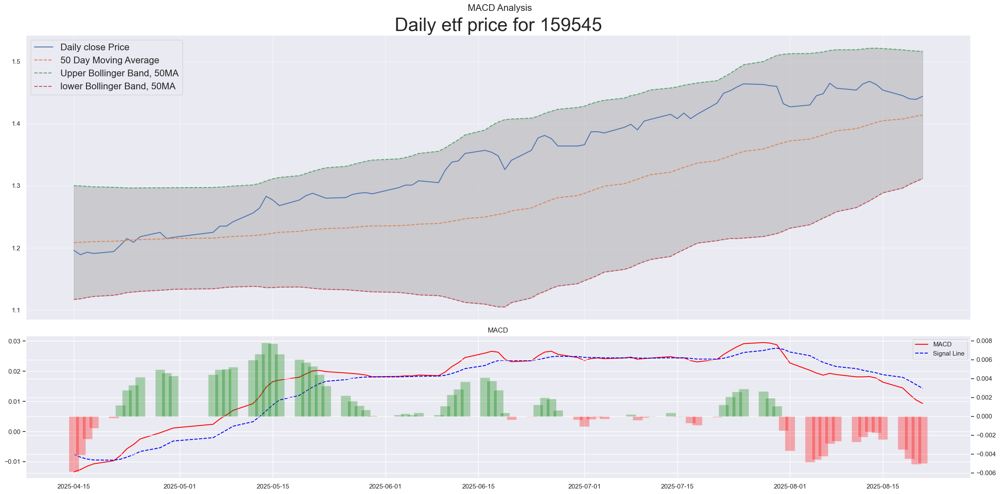

In [34]:
# 恒生红利低波
etf_code = "159545"
etf_strategy(etf_code).output()

* Current etf price: 2.99
* Recent high: 3.15
* Current etf price is at 95.07% of recent high
Latest 20 Day MA: 2.93
Latest lower Bollinger Band, 20MA: 2.88
Latest higher Bollinger Band, 20MA: 2.98
Latest 50 Day MA: 2.86
Latest lower Bollinger Band, 50MA: 2.69
Latest higher Bollinger Band, 50MA: 3.04
Latest 50 Day EMA: 2.88
Latest 120 Day MA: 2.79
Latest 200 Day MA: 2.75
Latest 200 Day EMA: 2.74
Latest 10 Week MA: 2.88
Latest 20 Week MA: 2.81
Latest 30 Week MA: 2.78
Latest 40 Week MA: 2.75
Latest Lower Weekly Bollinger Band, 20MA: 2.62
Latest Higher Weekly Bollinger Band, 20MA: 2.99

Latest RSI: 67.92 
Latest MACD Divergence: 0.0 
20MA crosses 50MA at 0.9
20MA break point: 2.93
20MA lower Bollinger Band break point: 2.87
20MA Upper Bollinger Band break point: 2.99
50MA break point: 2.87
50MA lower Bollinger Band break point: 2.68
50MA Upper Bollinger Band break point: 3.05
120MA break point: 2.79
200MA break point: 2.75


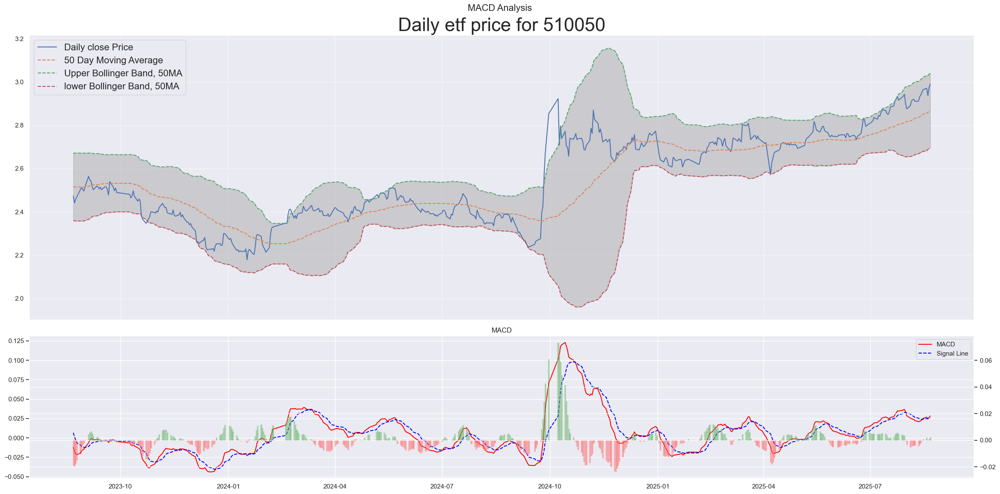

In [35]:
# 上证50
etf_code = "510050"
etf_strategy(etf_code).output()

### Test a "momentum driven" strategy

In [36]:
def backtest_momentum_strategy(price_df, initial_cash=100_000, cycle=21, window=20, sell_early=False):
    """
    Backtest the momentum strategy with X-trading-day evaluation cycle.
    Returns:
        result_df: Daily portfolio value DataFrame
        actions_df: Log of only buy/sell actions
    """
    price_df = price_df.sort_index()
    
    # cycle-day moving average
    ma = price_df.rolling(window=window).mean()
    
    # cycle-day % change
    pct_change = price_df.pct_change(cycle)
    
    # Portfolio state
    cash = initial_cash
    shares = 0
    current_stock = None
    portfolio_values = []
    actions = []

    dates = price_df.index
    
    # for i in range(cycle, len(dates)):  # start from the 22nd trading day
    for i in range(cycle, 21*13):  # Check performance for one year
        date = dates[i]
        
        # Step (1): every cycle trading days, rebalance
        if (i - cycle) % cycle == 0:
            # Sell previous stock if any
            if current_stock is not None:
                sell_price = price_df.loc[date, current_stock]
                cash += shares * sell_price
                actions.append([date, "SELL", current_stock, sell_price, shares])
                shares = 0
                current_stock = None
            
            # Find candidates above ma
            candidates = [s for s in price_df.columns 
                          if price_df.loc[date, s] > ma.loc[date, s]]
            
            if candidates:
                # Pick stock with largest cycle-day % change
                stock_changes = pct_change.loc[date, candidates]
                pick = stock_changes.idxmax()
                buy_price = price_df.loc[date, pick]
                current_stock = pick
                shares = cash // buy_price
                cash -= shares * buy_price
                actions.append([date, "BUY", pick, buy_price, shares])
        
        # Step (2): sell early if price drops below ma
        if sell_early and current_stock is not None:
            if price_df.loc[date, current_stock] < ma.loc[date, current_stock]:
                sell_price = price_df.loc[date, current_stock]
                cash += shares * sell_price
                actions.append([date, "SELL_EARLY", current_stock, sell_price, shares])
                shares = 0
                current_stock = None
        
        # Record portfolio value
        if current_stock is not None:
            value = cash + shares * price_df.loc[date, current_stock]
        else:
            value = cash
        portfolio_values.append((date, value))
    
    # Create results DataFrames
    result_df = pd.DataFrame(portfolio_values, columns=["Date", "PortfolioValue"])
    result_df.set_index("Date", inplace=True)
    
    actions_df = pd.DataFrame(actions, columns=["Date", "Action", "Stock", "Price", "Shares"])
    actions_df.set_index("Date", inplace=True)
    
    total_days = len(result_df)
    final_value = result_df["PortfolioValue"].iloc[-1]
    annualized_return = (final_value / initial_cash) ** (252 / total_days) - 1
    
    return result_df, actions_df, annualized_return


def average_annualized_return(price_df, initial_cash=100_000, n_test=100, cycle=21, window=20, sell_early=False):
    """
    Runs the strategy from different starting offsets (0-20) and averages annualized return.
    """
    returns = []
    for offset in range(n_test):  # 100 possible start offsets
        sliced_df = price_df.iloc[offset:].copy()
        if len(sliced_df) < 42:  # ensure enough data for lookback + holding
            continue
        _, _, ann_return = backtest_momentum_strategy(sliced_df, initial_cash, cycle=cycle, window=window, sell_early=sell_early)
        returns.append(ann_return)
    print(f"Average return: {np.mean(returns) if returns else np.nan}")
    print(f"Return STD: {np.std(returns) if returns else np.nan}")

    return returns

In [37]:
etf_list = [
"516570",
"512820",
"512260",
"512480",
"512580",
"159948",
"562500",
"159819",
"512600",
"560880",
"512400",
# "159697", # history too short
"515880",
"516080",
"159647",
"515220",
"512890",
"512980",
"159940",
"516110",
"513260",
"513060",
"513660",
# "159545", # history too short
"510050",
]
etf_code = etf_list[0]

df_all = ak.fund_etf_hist_em(
            symbol=etf_code.upper(),
            start_date=(datetime.today() - relativedelta(years=5)).strftime('%Y%m%d'),
            end_date=datetime.today().strftime('%Y%m%d'),
            period='daily',  # Default to daily,
            adjust='qfq'
)
df_all = df_all[['日期','收盘']].set_index('日期')
df_all = df_all.rename(columns={'收盘': etf_code})
for etf_code in etf_list[1:]:
    df = ak.fund_etf_hist_em(
            symbol=etf_code.upper(),
            start_date=(datetime.today() - relativedelta(years=5)).strftime('%Y%m%d'),
            end_date=datetime.today().strftime('%Y%m%d'),
            period='daily',  # Default to daily,
            adjust='qfq'
    )[['日期','收盘']].set_index('日期')
    df = df.rename(columns={'收盘': etf_code})
    df_all = pd.merge(df_all, df, left_index=True, right_index=True, how='inner')
df_all

,516570,512820,512260,512480,512580,159948,562500,159819,512600,560880,...,159647,515220,512890,512980,159940,516110,513260,513060,513660,510050
日期,,,,,,,,,,,,,,,,,,,,,
2022-09-13,0.931,0.895,1.477,0.939,1.634,2.720,0.771,0.692,0.878,1.150,...,0.952,1.271,0.889,0.586,0.935,1.123,0.996,0.511,2.081,2.677
2022-09-14,0.917,0.890,1.467,0.942,1.604,2.676,0.757,0.687,0.874,1.150,...,0.945,1.252,0.880,0.579,0.926,1.102,0.971,0.498,2.047,2.657
2022-09-15,0.896,0.898,1.442,0.911,1.525,2.591,0.730,0.672,0.872,1.128,...,0.934,1.258,0.889,0.576,0.933,1.062,0.972,0.500,2.056,2.653
2022-09-16,0.880,0.880,1.406,0.905,1.500,2.534,0.721,0.670,0.858,1.103,...,0.911,1.192,0.861,0.565,0.901,1.043,0.957,0.492,2.053,2.593
2022-09-19,0.883,0.882,1.396,0.888,1.495,2.510,0.717,0.658,0.865,1.100,...,0.898,1.198,0.860,0.553,0.899,1.051,0.941,0.476,2.033,2.588
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2025-08-15,0.798,1.481,1.693,1.154,1.016,2.792,0.961,1.152,0.700,1.516,...,1.043,1.093,1.195,0.915,1.318,1.331,1.433,0.717,3.138,2.965
2025-08-18,0.799,1.484,1.705,1.180,1.027,2.876,0.981,1.198,0.702,1.544,...,1.056,1.087,1.197,0.935,1.322,1.345,1.450,0.738,3.152,2.971
2025-08-19,0.791,1.485,1.699,1.163,1.023,2.863,0.988,1.202,0.707,1.554,...,1.060,1.082,1.196,0.940,1.311,1.349,1.440,0.719,3.131,2.937


In [38]:
returns = average_annualized_return(df_all, initial_cash=100000, cycle=21, window=50)

Average return: 0.002666469700000025
Return STD: 0.22948150017367788


In [39]:
returns = average_annualized_return(df_all, initial_cash=100000, cycle=21, window=20)

Average return: 0.087105991
Return STD: 0.2999394350202828


In [40]:
returns = average_annualized_return(df_all, initial_cash=100000, cycle=21, window=20)

Average return: 0.087105991
Return STD: 0.2999394350202828


In [41]:
result_df, actions_df, annualized_return = backtest_momentum_strategy(df_all, cycle=21, window=20)
print(annualized_return)
result_df

0.020996969999999227


,PortfolioValue
Date,
2022-10-19,100000.000
2022-10-20,99402.988
2022-10-21,99701.494
2022-10-24,96417.928
2022-10-25,94925.398
...,...
2023-10-27,102799.690
2023-10-30,101699.701
2023-10-31,102899.689


In [42]:
actions_df

,Action,Stock,Price,Shares
Date,,,,
2022-10-19,BUY,516080,0.670,149253.0
2022-11-17,SELL,516080,0.718,149253.0
2022-11-17,BUY,513060,0.573,187022.0
2022-12-16,SELL,513060,0.597,187022.0
2022-12-16,BUY,513260,1.050,106335.0
2023-01-17,SELL,513260,1.085,106335.0
2023-01-17,BUY,516080,0.753,153219.0
2023-02-22,SELL,516080,0.722,153219.0
2023-02-22,BUY,159819,0.807,137081.0


In [43]:
# benchmark
good_etfs = {
    "honglidibo": "512890",
    "hongli": "515180"}
for etf in good_etfs:
    etf_code = good_etfs[etf]
    df_etf = etf_strategy(etf_code, start='20150101').return_result()
    df_etf.set_index('date',inplace=True)
    valid_start_range = range(0, len(df_etf) - 252)
    start_points = np.random.choice(valid_start_range, size=800, replace=False)
    returns = []
    for start in start_points:
        dates = df_etf.index
        initial_date = dates[start]
        end_date = dates[start + 252]
        initial_price = df_etf.loc[initial_date]['close']
        end_price = df_etf.loc[end_date]['close']
        returns.append(end_price/initial_price - 1)
    print(etf)
    print(f"Average return: {np.mean(returns) if returns else np.nan}")
    print(f"Return STD: {np.std(returns) if returns else np.nan}")
    print(f"earning-cost ratio: {abs((np.mean(returns)+1.96*np.std(returns))/(np.mean(returns)-1.96*np.std(returns))) if returns else np.nan}")

honglidibo
Average return: 0.1427718433555436
Return STD: 0.07672426471951704
earning-cost ratio: 38.5334339079382
hongli
Average return: 0.08441576028623
Return STD: 0.06698894069844831
earning-cost ratio: 4.601158043217


Annual expected return rate: 12.85%
Maximal Drawdown: -19.24%
Peak date: 651 with price 0.9
Trough date: 2021-11-10 with price 0.73
Final price extracted: 1.19
R2: 0.959
Maximal Drawdown from regression price relative to regression price: 16.39%


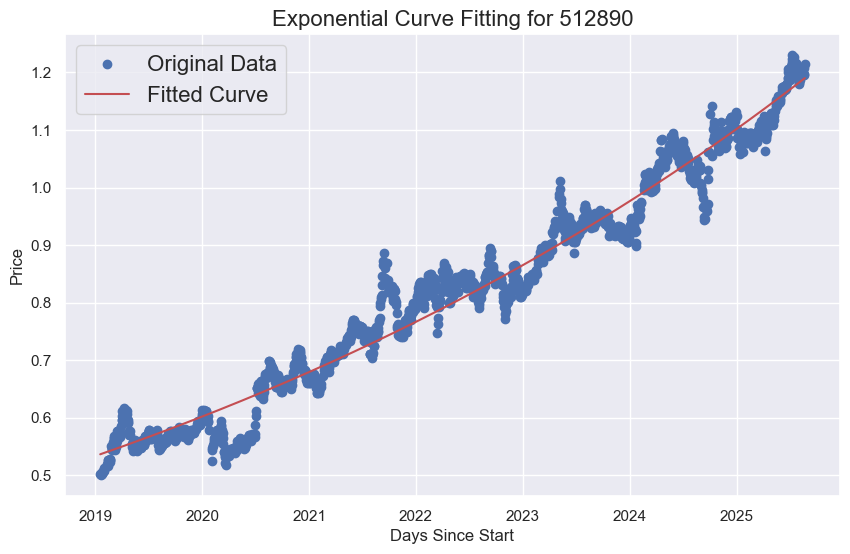

1.19

In [44]:
etf_regression("512890", detailed=True)

Annual expected return rate: 10.27%
Maximal Drawdown: -24.07%
Peak date: 422 with price 1.26
Trough date: 2022-03-16 with price 0.96
Final price extracted: 1.44
R2: 0.8298
Maximal Drawdown from regression price relative to regression price: 12.37%


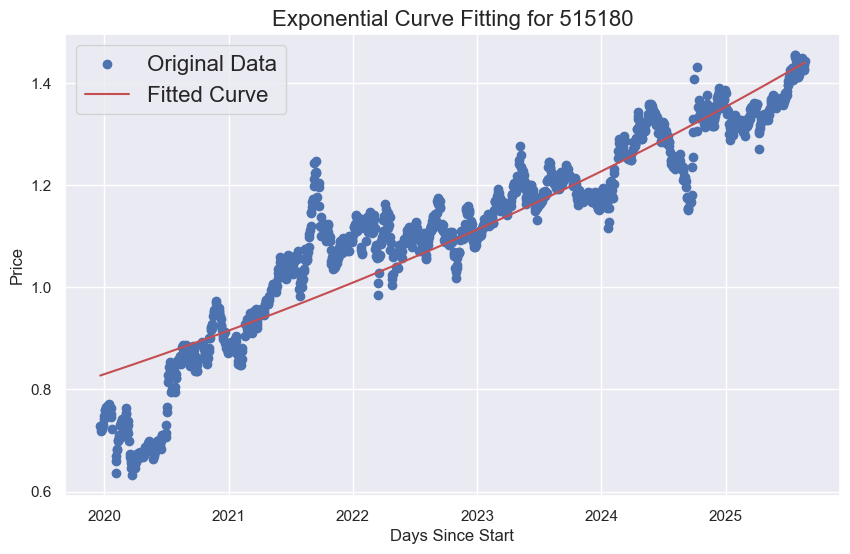

1.44

In [45]:
etf_regression("515180", detailed=True)